230347 JERZY ANDRZEJEWSKI

TASK 1

In [1]:
import skimage as sk
import random
import matplotlib.pyplot as plt
import numpy as np

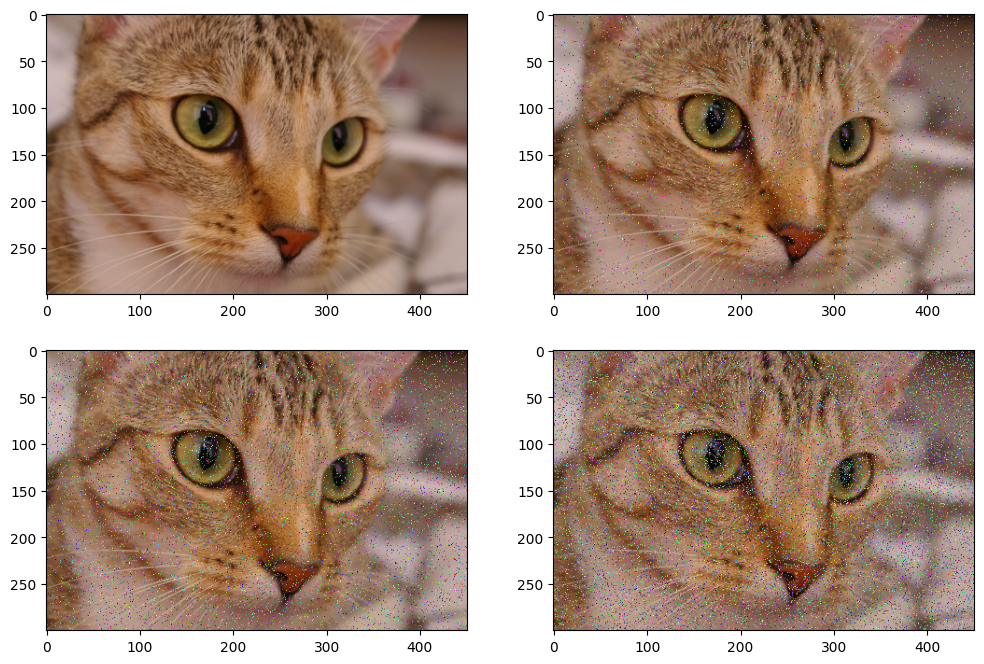

In [2]:
image = sk.data.chelsea()
noised_images = []
for index, p in enumerate([5, 10, 20]):
    N = image.shape[0] * image.shape[1] * p // 100
    noised_images.append(image.copy())
    for counter in range(0, N):
        x = random.randint(0, image.shape[1]-1)
        y = random.randint(0, image.shape[0]-1)
        R, G, B = random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)
        noised_images[index][y,x] = (R, G, B)
    
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)
fig.set_figwidth(12)
fig.set_figheight(8)
ax1.imshow(image)
ax2.imshow(noised_images[0])
ax3.imshow(noised_images[1])
ax4.imshow(noised_images[2])
plt.show()


TASK 2

In [3]:
def NMSE(orig_image, comp_image):
    return round( np.sum(np.square(orig_image-comp_image))/np.sum(np.square(orig_image)), 9)

percentage = 5
for x in noised_images:
    print(f'{percentage}% noised image {NMSE(orig_image = image, comp_image = x)}')
    percentage *= 2

5% noised image 0.049505859
10% noised image 0.097138251
20% noised image 0.183909086


TASK 3

DISTANCE FUNCTION

In [4]:
def distance(p0, p1):
    new_p0 = [0,0,0]
    new_p1 = [0,0,0]
    for x in range(0,3):
        new_p0[x] = int(p0[x])
        new_p1[x] = int(p1[x])
    return np.sqrt(np.square(new_p0[0] - new_p1[0]) + np.square(new_p0[1] - new_p1[1]) + np.square(new_p0[2] - new_p1[2]))

CROSS VMF

In [5]:

def vmf(image):
    img = image.copy()
    for x in range(1, image.shape[0] - 1):
        for y in range(1, image.shape[1] - 1):

            p0 = img[x,y]
            p1 = img[x,y-1]
            p2 = img[x+1,y]
            p3 = img[x,y+1]
            p4 = img[x-1,y]
            
            sum0 = (distance(p0, p1) + distance(p0, p2) + distance(p0, p3) + distance(p0, p4))
            sum1 = (distance(p1, p0) + distance(p1, p2) + distance(p1, p3) + distance(p1, p4))
            sum2 = (distance(p2, p0) + distance(p2, p1) + distance(p2, p3) + distance(p2, p4))
            sum3 = (distance(p3, p0) + distance(p3, p1) + distance(p3, p2) + distance(p3, p4))
            sum4 = (distance(p4, p0) + distance(p4, p1) + distance(p4, p2) + distance(p4, p3))
            
            summin = sum0
            if(summin > sum1):
                p0 = p1
                summin = sum1
            if(summin > sum2):
                p0 = p2
                summin = sum2
            if(summin > sum3):
                p0 = p3
                summin = sum3
            if(summin > sum4):
                p0 = p4
            img[x,y]=p0
    return img

CROSS VMF RESULTS

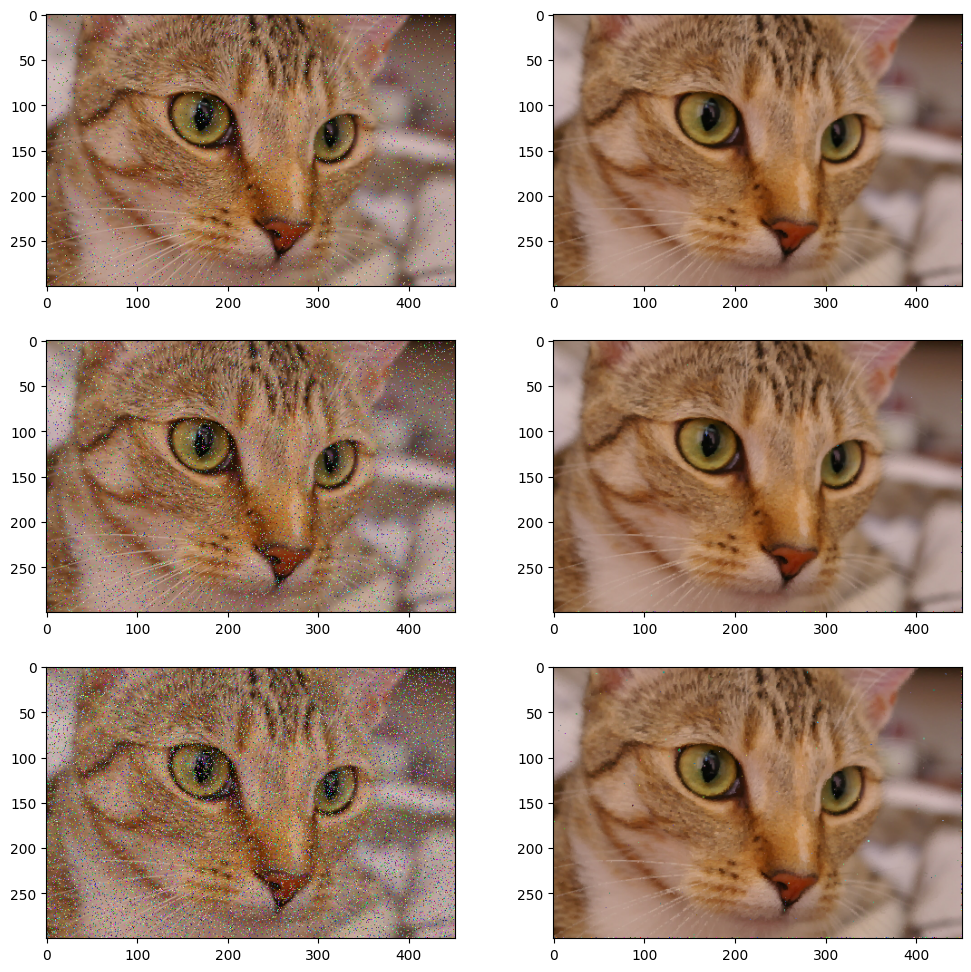

5% noised image NMSE 0.049505859
5% denoised image NMSE 0.112710167
10% noised image NMSE 0.097138251
10% denoised image NMSE 0.127216474
20% noised image NMSE 0.183909086
20% denoised image NMSE 0.157592009


In [6]:
vmf_denoised = [vmf(noised_images[0]), vmf(noised_images[1]), vmf(noised_images[2])]
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2)
fig.set_figwidth(12)
fig.set_figheight(12)
ax1.imshow(noised_images[0])
ax2.imshow(vmf_denoised[0])
ax3.imshow(noised_images[1])
ax4.imshow(vmf_denoised[1])
ax5.imshow(noised_images[2])
ax6.imshow(vmf_denoised[2])
plt.show()

percentage = 5
for counter, x in enumerate(noised_images):
    print(f'{percentage}% noised image NMSE {NMSE(image, x)}')
    print(f'{percentage}% denoised image NMSE {NMSE(image, vmf_denoised[counter])}')
    percentage *= 2

CROSS FMVMF FUNCTION

In [7]:
def fmvmf(image):
    beta = 0.75
    img = image.copy()
    for x in range(1, image.shape[0] - 1):
        for y in range(1, image.shape[1] - 1):

            p0 = img[x,y]
            p1 = img[x,y-1]
            p2 = img[x+1,y]
            p3 = img[x,y+1]
            p4 = img[x-1,y]
            
            sum0 = (distance(p0, p1) + distance(p0, p2) + distance(p0, p3) + distance(p0, p4)) - beta
            sum1 = (distance(p1, p2) + distance(p1, p3) + distance(p1, p4))
            sum2 = (distance(p2, p1) + distance(p2, p3) + distance(p2, p4))
            sum3 = (distance(p3, p1) + distance(p3, p2) + distance(p3, p4))
            sum4 = (distance(p4, p1) + distance(p4, p2) + distance(p4, p3))
            
            summin = sum1
            ptmp = p1
            if(summin > sum2):
                ptmp = p2
                summin = sum2
            if(summin > sum3):
                ptmp = p3
                summin = sum3
            if(summin > sum4):
                ptmp = p4
                summin = sum4
            if(sum0 - beta < summin):
                p0 = ptmp
            
            img[x,y] = ptmp
    return img

CROSS FMVMF RESULTS

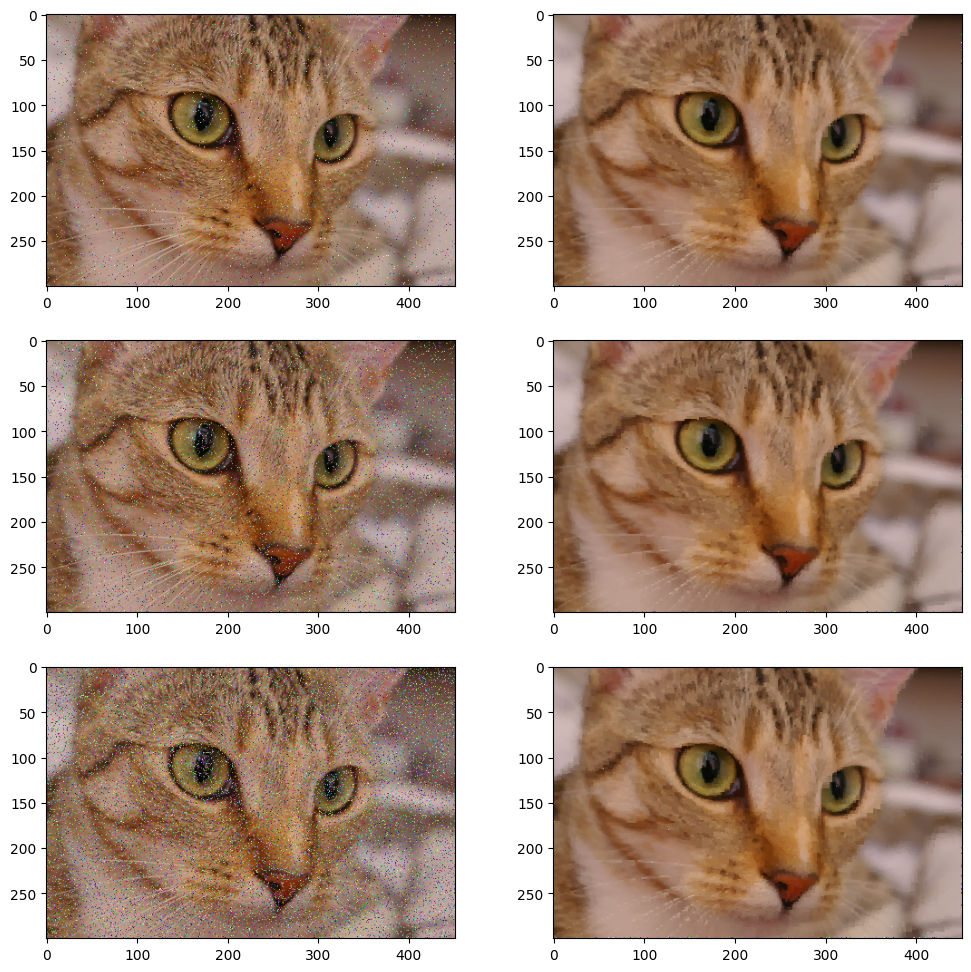

5% noised image NMSE 0.049505859
5% denoised image NMSE 0.259231353
10% noised image NMSE 0.097138251
10% denoised image NMSE 0.272806282
20% noised image NMSE 0.183909086
20% denoised image NMSE 0.296071047


In [8]:
fmvmf_denoised = [fmvmf(noised_images[0]), fmvmf(noised_images[1]), fmvmf(noised_images[2])]
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2)
fig.set_figwidth(12)
fig.set_figheight(12)
ax1.imshow(noised_images[0])
ax2.imshow(fmvmf_denoised[0])
ax3.imshow(noised_images[1])
ax4.imshow(fmvmf_denoised[1])
ax5.imshow(noised_images[2])
ax6.imshow(fmvmf_denoised[2])
plt.show()

percentage = 5
for counter, x in enumerate(noised_images):
    print(f'{percentage}% noised image NMSE {NMSE(image, x)}')
    print(f'{percentage}% denoised image NMSE {NMSE(image, fmvmf_denoised[counter])}')
    percentage *= 2

CROSS PNNVMF FUNCTION

In [9]:
def pnnvmf(denoised_img, image):
    beta = 0.75
    img = image.copy()
    for x in range(1, image.shape[0] - 1):
        for y in range(1, image.shape[1] - 1):
            p3N = denoised_img[x,y+1]
            p4N = denoised_img[x-1,y]
            p0 = img[x,y]
            p1 = img[x,y-1]
            p2 = img[x+1,y]
            p3 = img[x,y+1]
            p4 = img[x-1,y]
            
            sum0 = (distance(p0, p1) + distance(p0, p2) + distance(p0, p3N) + distance(p0, p4N)) - beta
            sum1 = (distance(p1, p2) + distance(p1, p3) + distance(p1, p4N))
            sum2 = (distance(p2, p1) + distance(p2, p3N) + distance(p2, p4N))
            sum3 = (distance(p3N, p1) + distance(p3N, p2) + distance(p3, p4N))
            sum4 = (distance(p4N, p1) + distance(p4N, p2) + distance(p4, p3N))
            
            howmanygt = 0
            if(sum0 > sum1):
                howmanygt += 1
            if(sum0 > sum2):
                howmanygt += 1
            if(sum0 > sum3):
                howmanygt += 1
            if(sum0 > sum4):
                howmanygt += 1
            if(howmanygt < 2):
                continue
            
            summin = sum1
            p0 = p1
            if(sum2 < summin):
                p0 = p2
                summin = sum2
            if(sum3 < summin):
                p0 = p3
                summin = sum3
            if(sum4 < summin):
                p0 = p4
            
            img[x,y] = p0
    return img

CROSS PNNVMF RESULTS

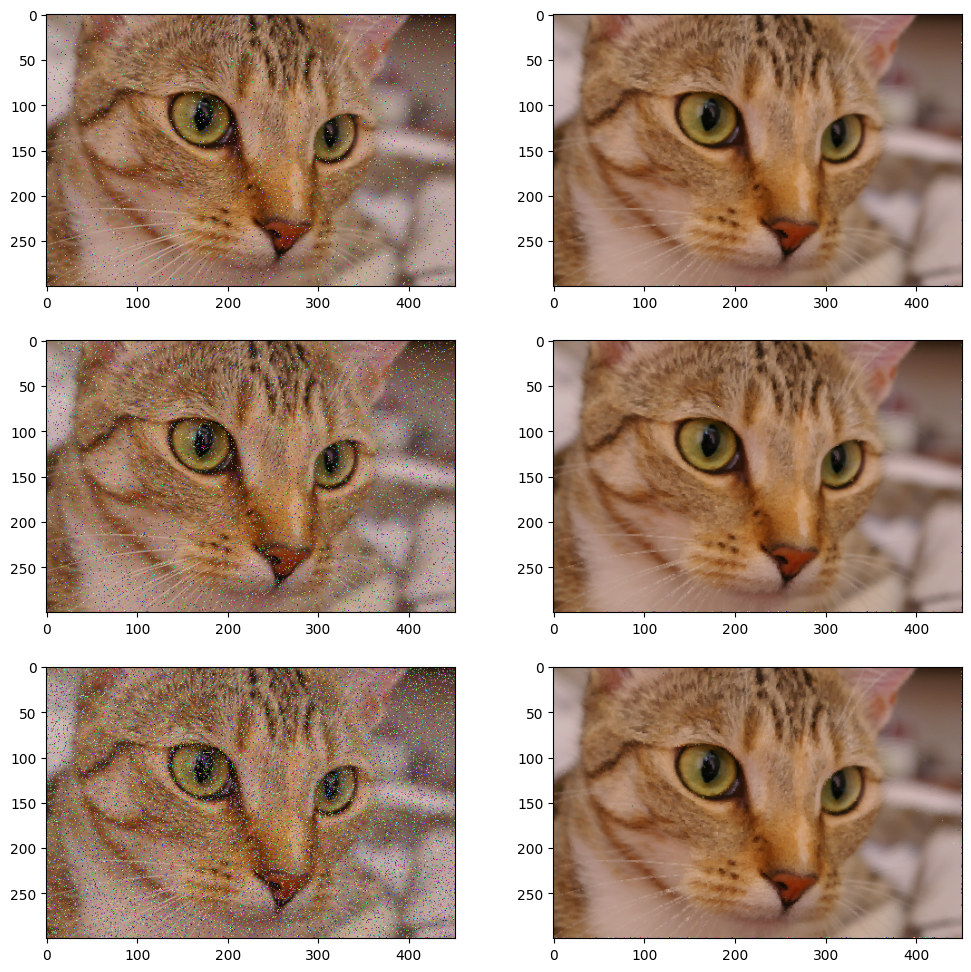

5% noised image NMSE 0.049505859
5% denoised image NMSE 0.155778551
10% noised image NMSE 0.097138251
10% denoised image NMSE 0.161958039
20% noised image NMSE 0.183909086
20% denoised image NMSE 0.17732136


In [10]:
pnnvmf_denoised = [pnnvmf(vmf_denoised[0], noised_images[0]), pnnvmf(vmf_denoised[1], noised_images[1]), pnnvmf(vmf_denoised[2], noised_images[2])]
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2)
fig.set_figwidth(12)
fig.set_figheight(12)
ax1.imshow(noised_images[0])
ax2.imshow(pnnvmf_denoised[0])
ax3.imshow(noised_images[1])
ax4.imshow(pnnvmf_denoised[1])
ax5.imshow(noised_images[2])
ax6.imshow(pnnvmf_denoised[2])
plt.show()

percentage = 5
for counter, x in enumerate(noised_images):
    print(f'{percentage}% noised image NMSE {NMSE(image, x)}')
    print(f'{percentage}% denoised image NMSE {NMSE(image, pnnvmf_denoised[counter])}')
    percentage *= 2

TASK 4

3x3 VMF FUNCTION

In [11]:
def vmf9(image):
    img = image.copy()
    for x in range(1, image.shape[0] - 1):
        for y in range(1, image.shape[1] - 1):

            p0 = img[x,y]
            p1 = img[x,y-1]
            p2 = img[x+1,y-1]
            p3 = img[x+1,y]
            p4 = img[x+1,y+1]
            p5 = img[x,y+1]
            p6 = img[x-1,y+1]
            p7 = img[x-1,y]
            p8 = img[x-1,y-1]
            
            sum0 = (distance(p0, p1) + distance(p0, p2) + distance(p0, p3) + distance(p0, p4) + distance(p0, p5) + distance(p0, p6) + distance(p0, p7) + distance(p0, p8))
            sum1 = (distance(p1, p0) + distance(p1, p2) + distance(p1, p3) + distance(p1, p4) + distance(p1, p5) + distance(p1, p6) + distance(p1, p7) + distance(p1, p8))
            sum2 = (distance(p2, p0) + distance(p2, p1) + distance(p2, p3) + distance(p2, p4) + distance(p2, p5) + distance(p2, p6) + distance(p2, p7) + distance(p2, p8))
            sum3 = (distance(p3, p0) + distance(p3, p1) + distance(p3, p2) + distance(p3, p4) + distance(p3, p5) + distance(p3, p6) + distance(p3, p7) + distance(p3, p8))
            sum4 = (distance(p4, p0) + distance(p4, p1) + distance(p4, p2) + distance(p4, p3) + distance(p4, p5) + distance(p4, p6) + distance(p4, p7) + distance(p4, p8))
            sum5 = (distance(p5, p0) + distance(p5, p1) + distance(p5, p2) + distance(p5, p3) + distance(p5, p4) + distance(p5, p6) + distance(p5, p7) + distance(p5, p8))
            sum6 = (distance(p6, p0) + distance(p6, p1) + distance(p6, p2) + distance(p6, p3) + distance(p6, p4) + distance(p6, p5) + distance(p6, p7) + distance(p6, p8))
            sum7 = (distance(p7, p0) + distance(p7, p1) + distance(p7, p2) + distance(p7, p3) + distance(p7, p4) + distance(p7, p5) + distance(p7, p6) + distance(p7, p8))
            sum8 = (distance(p8, p0) + distance(p8, p1) + distance(p8, p2) + distance(p8, p3) + distance(p8, p4) + distance(p8, p5) + distance(p8, p6) + distance(p8, p7))
            
            summin = sum0
            if(summin > sum1):
                p0 = p1
                summin = sum1
            if(summin > sum2):
                p0 = p2
                summin = sum2
            if(summin > sum3):
                p0 = p3
                summin = sum3
            if(summin > sum4):
                p0 = p4
            if(summin > sum5):
                p0 = p5
                summin = sum5
            if(summin > sum6):
                p0 = p6
                summin = sum6
            if(summin > sum7):
                p0 = p7
                summin = sum7
            if(summin > sum8):
                p0 = p8
            img[x,y]=p0
    return img

3x3 VMF RESULTS

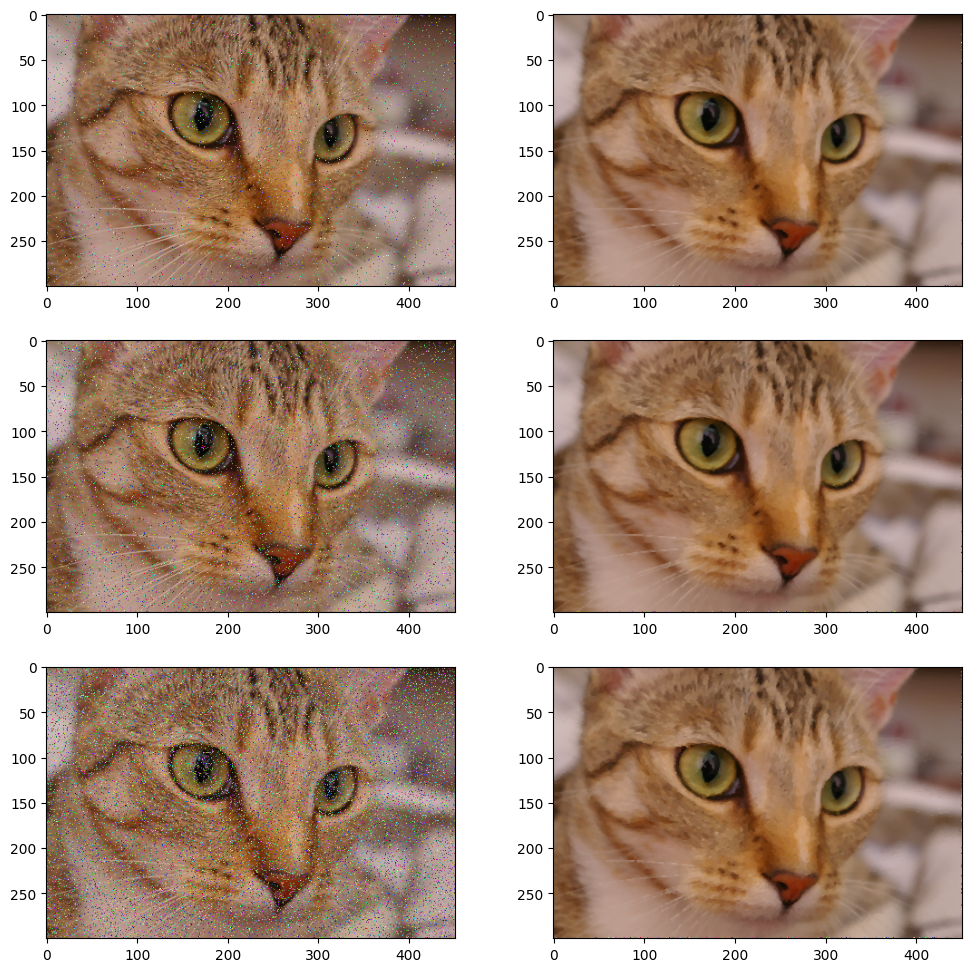

5% noised image NMSE 0.049505859
5% denoised image NMSE 0.182612745
10% noised image NMSE 0.097138251
10% denoised image NMSE 0.195934258
20% noised image NMSE 0.183909086
20% denoised image NMSE 0.228013824


In [12]:
vmf9_denoised = [vmf9(noised_images[0]), vmf9(noised_images[1]), vmf9(noised_images[2])]
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2)
fig.set_figwidth(12)
fig.set_figheight(12)
ax1.imshow(noised_images[0])
ax2.imshow(vmf9_denoised[0])
ax3.imshow(noised_images[1])
ax4.imshow(vmf9_denoised[1])
ax5.imshow(noised_images[2])
ax6.imshow(vmf9_denoised[2])
plt.show()

percentage = 5
for counter, x in enumerate(noised_images):
    print(f'{percentage}% noised image NMSE {NMSE(image, x)}')
    print(f'{percentage}% denoised image NMSE {NMSE(image, vmf9_denoised[counter])}')
    percentage *= 2

3x3 FMVMF FUNCTION

In [13]:
def fmvmf9(image):
    beta = 0.75
    img = image.copy()
    for x in range(1, image.shape[0] - 1):
        for y in range(1, image.shape[1] - 1):

            p0 = img[x,y]
            p1 = img[x,y-1]
            p2 = img[x+1,y-1]
            p3 = img[x+1,y]
            p4 = img[x+1,y+1]
            p5 = img[x,y+1]
            p6 = img[x-1,y+1]
            p7 = img[x-1,y]
            p8 = img[x-1,y-1]
            
            sum0 = (distance(p0, p1) + distance(p0, p2) + distance(p0, p3) + distance(p0, p4) + distance(p0, p5) + distance(p0, p6) + distance(p0, p7) + distance(p0, p8)) - beta
            sum1 = (distance(p1, p2) + distance(p1, p3) + distance(p1, p4) + distance(p1, p5) + distance(p1, p6) + distance(p1, p7) + distance(p1, p8))
            sum2 = (distance(p2, p1) + distance(p2, p3) + distance(p2, p4) + distance(p2, p5) + distance(p2, p6) + distance(p2, p7) + distance(p2, p8))
            sum3 = (distance(p3, p1) + distance(p3, p2) + distance(p3, p4) + distance(p3, p5) + distance(p3, p6) + distance(p3, p7) + distance(p3, p8))
            sum4 = (distance(p4, p1) + distance(p4, p2) + distance(p4, p3) + distance(p4, p5) + distance(p4, p6) + distance(p4, p7) + distance(p4, p8))
            sum5 = (distance(p5, p1) + distance(p5, p2) + distance(p5, p3) + distance(p5, p4) + distance(p5, p6) + distance(p5, p7) + distance(p5, p8))
            sum6 = (distance(p6, p1) + distance(p6, p2) + distance(p6, p3) + distance(p6, p4) + distance(p6, p5) + distance(p6, p7) + distance(p6, p8))
            sum7 = (distance(p7, p1) + distance(p7, p2) + distance(p7, p3) + distance(p7, p4) + distance(p7, p5) + distance(p7, p6) + distance(p7, p8))
            sum8 = (distance(p8, p1) + distance(p8, p2) + distance(p8, p3) + distance(p8, p4) + distance(p8, p5) + distance(p8, p6) + distance(p8, p7))
            
            summin = sum1
            ptmp = p1
            if(summin > sum2):
                ptmp = p2
                summin = sum2
            if(summin > sum3):
                ptmp = p3
                summin = sum3
            if(summin > sum4):
                ptmp = p4
                summin = sum4
            if(summin > sum5):
                ptmp = p5
                summin = sum5
            if(summin > sum6):
                ptmp = p6
                summin = sum6
            if(summin > sum7):
                ptmp = p7
                summin = sum7
            if(summin > sum8):
                ptmp = p8
                summin = sum8
            
            
            if(sum0 - beta < summin):
                p0 = ptmp
            
            img[x,y] = ptmp
    return img

3x3 FMVMF RESULTS

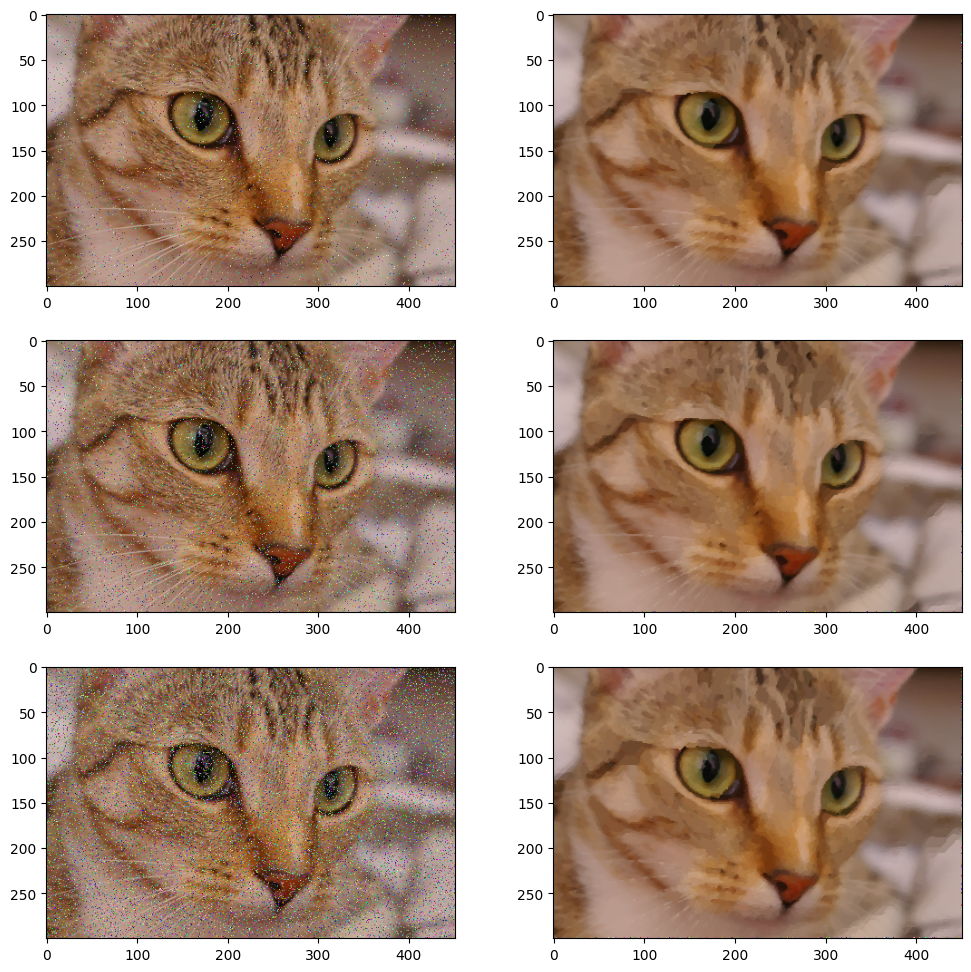

5% noised image NMSE 0.049505859
5% denoised image NMSE 0.291775692
10% noised image NMSE 0.097138251
10% denoised image NMSE 0.311227751
20% noised image NMSE 0.183909086
20% denoised image NMSE 0.352695461


In [14]:
fmvmf9_denoised = [fmvmf9(noised_images[0]), fmvmf9(noised_images[1]), fmvmf9(noised_images[2])]
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2)
fig.set_figwidth(12)
fig.set_figheight(12)
ax1.imshow(noised_images[0])
ax2.imshow(fmvmf9_denoised[0])
ax3.imshow(noised_images[1])
ax4.imshow(fmvmf9_denoised[1])
ax5.imshow(noised_images[2])
ax6.imshow(fmvmf9_denoised[2])
plt.show()

percentage = 5
for counter, x in enumerate(noised_images):
    print(f'{percentage}% noised image NMSE {NMSE(image, x)}')
    print(f'{percentage}% denoised image NMSE {NMSE(image, fmvmf9_denoised[counter])}')
    percentage *= 2